# Jupyter Notebook for Julia
## Installing the Julia to the Google Colab
#### Run the following two cells.
"Run" means 
- Put the cursor on the cel and shift+enter on Jupyter Notebook
- Tap the circle near the upper left corner of the cell on Google Colab  

In [ ]:
!curl -fsSL https://install.julialang.org | sh -s -- --yes

!julia -v

#### Go to "Runtime" $\rightarrow$ "Change runtime type", and choose "Julia".
If Julia is already isntalled in your Google Colab, then you can begin with this action. 

## Installing packages
#### Run the following cell. The installation takes a few minutes.  

In [ ]:
using Pkg
Pkg.add("LaTeXStrings")
Pkg.add("Images")
Pkg.add("Plots")
Pkg.add("Colors")
Pkg.add("Downloads")
Pkg.add("FileIO")
Pkg.add("LowRankApprox")
Pkg.add("Wavelets")
Pkg.add("DSP")
Pkg.add("Dates")
Pkg.add("CSV")
Pkg.add("DataFrames")
Pkg.add("Statistics")

In [18]:
using Random
using LinearAlgebra
using LaTeXStrings
using Images
using Plots
using Colors
using Downloads
using FileIO
using LowRankApprox
using Wavelets
using DSP
using Dates
using CSV
using DataFrames
using Statistics

## Topics
1. RGB images
2. RGB movies
3. Singular value decomposition and low rank approximation
4. Wavelet decomposition
5. Public data and visualization
6. Central limit theorem for the binomial distribution $B(n,p)$
7. Taylor series of $\sin{x}$

## 1. RGB images
The data of an RGB image is a triplet of matrices of the same size. This is essentially a triplet of grayscale images of the same size. These three grayscale images, colored red, green, and blue, are then overlaid to form an RGB image.
#### Run the following cell to create three $m{\times}n=10\times15$ matrices $R,G,B$ by random numbers. 

In [4]:
Random.seed!(1)
m, n = 10, 15 # size of matrices

Z = zeros(m, n); # zero matrix
R = rand(m, n);
G = rand(m, n);
B = rand(m, n) # See below

10×15 Matrix{Float64}:
 0.670414   0.643352  0.376138   0.983634   …  0.899505  0.380349   0.221796
 0.691898   0.100056  0.218766   0.40892       0.424926  0.958143   0.950771
 0.192718   0.164962  0.60248    0.0424498     0.237027  0.610986   0.839523
 0.516169   0.959669  0.753166   0.705895      0.189413  0.619391   0.736151
 0.0475605  0.72755   0.852577   0.0647826     0.049791  0.849654   0.777125
 0.245685   0.436295  0.88632    0.792918   …  0.587347  0.515305   0.0444534
 0.979139   0.396001  0.0642346  0.080433      0.171102  0.0882561  0.0745833
 0.0294498  0.419402  0.890999   0.998768      0.265295  0.811548   0.626937
 0.224011   0.525583  0.988467   0.0620525     0.480608  0.0926662  0.601864
 0.80577    0.21062   0.292272   0.199147      0.582327  0.494502   0.440245

#### Run the following cell to colorize  $R,G,B$, and show red, green, blue and RGB images.

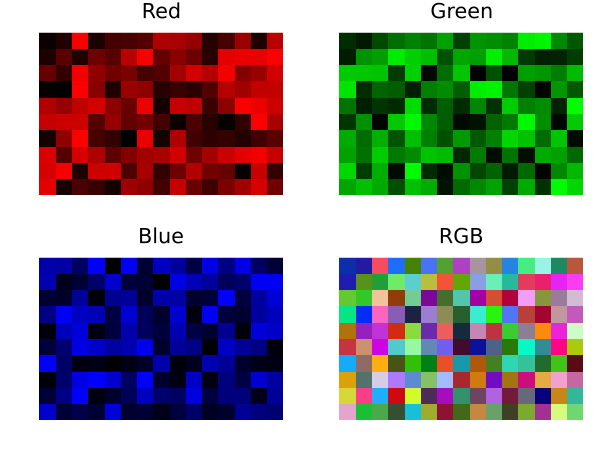

In [5]:
imgR = colorview(RGB, R, Z, Z)
imgG = colorview(RGB, Z, G, Z)
imgB = colorview(RGB, Z, Z, B)
imgRGB = colorview(RGB, R, G, B)

p1 = plot(imgR, grid=false, axis=false, title="Red")
p2 = plot(imgG, grid=false, axis=false, title="Green")
p3 = plot(imgB, grid=false, axis=false, title="Blue")
p4 = plot(imgRGB, grid=false, axis=false, title="RGB")

plot(p1, p2, p3, p4, layout=(2,2), size=(600,450))

In [ ]:
# If you want to save the abovem run this cell.
savefig("rgb_matrix.png")

## 2. RGB movies
The data of an RGB movie is the finite number of triplets of matrices of the same size. This is essentially a sequence of RGB images of the same size. 
#### Run the following cell to create 100 $m{\times}n=10\times15$ RGB images by random numbers. 

In [6]:
Random.seed!(1)
m, n = 10, 15 # size of matrices
K = 100 # steps, length of the sequence

Z = zeros(m, n);
RR = rand(m, n, K);
GG = rand(m, n, K);
BB = rand(m, n, K);


#### Run the following cell to see the movie.

[ Info: Saved animation to /home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/rgb_animation.gif


Plots.AnimatedGif("/home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/rgb_animation.gif")
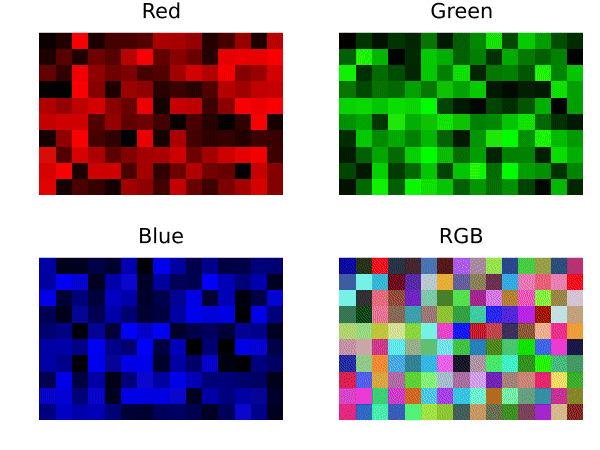

In [7]:
anim2 = @animate for k=1:K

movieR = colorview(RGB, RR[:,:,k], Z, Z)
movieG = colorview(RGB, Z, GG[:,:,k], Z)
movieB = colorview(RGB, Z, Z, BB[:,:,k])
movieRGB = colorview(RGB, RR[:,:,k], GG[:,:,k], BB[:,:,k])

p1 = plot(movieR, grid=false, axis=false, title="Red")
p2 = plot(movieG, grid=false, axis=false, title="Green")
p3 = plot(movieB, grid=false, axis=false, title="Blue")
p4 = plot(movieRGB, grid=false, axis=false, title="RGB")

plot(p1, p2, p3, p4, layout=(2,2), size=(600,450))

end
gif(anim2, "rgb_animation.gif", fps = 3)	

## 3. Singular value decomposition and low rank approximation
In general an $m{\times}n$ matrix $A=\begin{bmatrix}\vec{a}_1 & \dotsb & \vec{a}_n \end{bmatrix}$ has a specific nonnegative integer which is called as the rank of  $A$ defined by 

$$r
:=
\operatorname{dim}\bigl(
\{
A\vec{x}
=
x_1\vec{a}_1+\dotsb+x_n\vec{a}_n 
\ \vert \ 
\vec{x} \in \mathbb{R}^n
\}
\bigr).$$ 

It follows that $1 \leqq r \leqq \min\{m,n\}$ unless all the entries of $A$ are zero. It is known that there exist  

$$\sigma_1 \geqq \dotsb \geqq \sigma_r>0,
\quad
\vec{u}_1,\dotsc,\vec{u}_r \in \mathbb{R}^m,
\quad
\vec{v}_1,\dotsc,\vec{v}_r \in \mathbb{R}^n$$

such that we have the **singular value decomposition**:

$$A=\sum_{j=1}^r\sigma_j\vec{u}_j\vec{v}_j^T.$$

Set 

$$A_k:=\sum_{j=1}^k\sigma_j\vec{u}_j\vec{v}_j^T, \quad k=1,\dotsc,r.$$

It is known that the rank of $A_k$ is $k$ and closest to $A$ among all the $m{\times}n$ matrices of rank $k$, that is, $A_k$ is the best approximation of $A$ among all the $m{\times}n$ matrices of rank $k$.   

We compute a $432\times768\times3$ RGB image of a hibiscus. All the R, G, B matrices are of rank $432$.

#### Run the following cell to compute the SVD of the RGB-elements of the picture.


In [2]:
url = "https://raw.githubusercontent.com/fiomfd/hands-on/refs/heads/main/data/hibiscus.jpg"
Downloads.download(url, "hibiscus.jpg")
I=load("./hibiscus.jpg");
X=imresize(I, ratio=1/5);
(p,q)=size(X);
AAA=channelview(X);
RRR=Array{Float64}(AAA[1,:,:]);
GGG=Array{Float64}(AAA[2,:,:]);
BBB=Array{Float64}(AAA[3,:,:]);

RU, RS, RV=psvd(RRR);
GU, GS, GV=psvd(GGG);
BU, BS, BV=psvd(BBB);
	
rank=60;
DR=zeros(p,q,rank);
DG=zeros(p,q,rank);
DB=zeros(p,q,rank);
for r=1:rank
    DR[:,:,r]=sum(RS[n]*RU[1:p,n]*(RV[1:q,n])' for n=1:r);
    DG[:,:,r]=sum(GS[n]*GU[1:p,n]*(GV[1:q,n])' for n=1:r);
    DB[:,:,r]=sum(BS[n]*BU[1:p,n]*(BV[1:q,n])' for n=1:r);
end

#### Run the following cell to see the movie of the best low rank approximation for $r=1,\dotsc,60$.

[ Info: Saved animation to /home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/rgb_animation2.gif


Plots.AnimatedGif("/home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/rgb_animation2.gif")
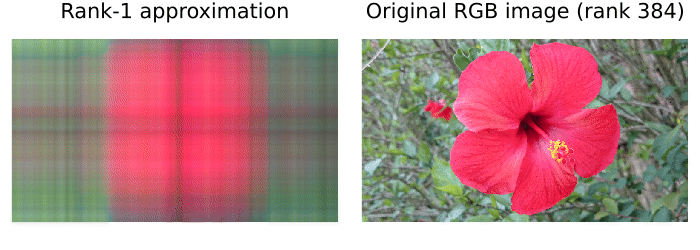

In [3]:
animsvd = @animate for k=1:rank

W=zeros(3,p,q,rank);
for r=1:rank
	W[1,:,:,r]=DR[:,:,r];
    W[2,:,:,r]=DG[:,:,r];
    W[3,:,:,r]=DB[:,:,r];
end

SVD1=plot(colorview(RGB,W[:,:,:,k]),
        title="Rank-$k approximation",
        xaxis=false, 
        xticks=false, 
        yaxis=false, 
        yticks=false, 
        grid=false);
SVD2=plot(colorview(RGB,X),
        title="Original RGB image (rank 384)",
        xaxis=false, 
        xticks=false, 
        yaxis=false, 
        yticks=false, 
        grid=false);
plot(SVD1,SVD2, layout=(1,2), size=(700,250))

end
gif(animsvd, "svd_animation.gif", fps = 3)	

## 4. Wavelet decomposition

The discrete wavelet is a pair of orthonomal two vectors $\vec{u}$ and $\vec{v}$ satisfying some condition, and the most typical example of the discrete wavelets is the Haar wavelet. They are very simple vectors: 

$$\vec{u}
=
\frac{1}{\sqrt{2}}
\begin{bmatrix}
1
\\
1
\\
0
\\
\vdots
\\
0 
\end{bmatrix}, 
\quad
\vec{v}
=
\frac{1}{\sqrt{2}}
\begin{bmatrix}
1
\\
-1
\\
0
\\
\vdots
\\
0 
\end{bmatrix}
\in\mathbb{R}^{N},$$

Roughly speaking the discrete wavelet transform by the Haar wavelet is to take averages of neighboring elements. The elements of a vector are transformed  to the average of neighboring two elements, and the elements of a matrix are converted to the average of neighboring 2 by 2 elements. The following examples show the outcomes of repeating the discere wavelet tranform twice: 

$$\vec{a}_0
=
\begin{bmatrix}
1 \\ 3 \\ 5 \\ 7 
\end{bmatrix}
\mapsto 
\vec{a}_1
=
\begin{bmatrix}
2 \\ 2 \\ 6 \\ 6 
\end{bmatrix}
\mapsto 
\vec{a}_2
=
\begin{bmatrix}
4 \\ 4 \\ 4 \\ 4 
\end{bmatrix}$$

$$A_0
=
\begin{bmatrix}
0 & 2 & 4 & 6
\\ 
8 & 10 & 12 & 14 
\\ 
16 & 18 & 20 & 22
\\ 
24 & 26 & 28 & 30
\end{bmatrix}
\mapsto 
A_1
=
\begin{bmatrix}
5 & 5 & 9 & 9
\\ 
5 & 5 & 9 & 9 
\\ 
21 & 21 & 25 & 25
\\ 
21 & 21 & 25 & 25
\end{bmatrix}
\mapsto 
A_2
=
\begin{bmatrix}
15 & 15 & 15 & 15
\\ 
15 & 15 & 15 & 15 
\\ 
15 & 15 & 15 & 15
\\ 
15 & 15 & 15 & 15
\end{bmatrix}.$$


The output such as $\vec{a}_\ell$ and $A_\ell$ of $\ell$ times operations is said to be the approximation part of level $\ell$, and the remainder term such as $\vec{a}_0-\vec{a}_\ell$ and $A_0-A_\ell$ is called the detail part of level $\ell$. In terms of Fourier analysis, the approximation part is the low frequency part, and the detail part is the high frequency part and is similar to the edge detection. 

We observe the wavelet decomposition of the $432\times768$ RGB image of hibiscus using the Haar wavelet. We can get the wavelet decomposition up to level $4$ since $432=2^4\times27$ and $768=2^4\times48$. We also show the denoised detail part, in which the elements less than gamma$\times$maximum are replaced by zero.   

#### Choose gamma and run the following cell to implement the wavelet decomposition. The choice $0.05 < \text{gamma} < 0.1$ is recomennded.

In [56]:
# Choose 0 < gamma < 0.5 
gamma=0.07

# Maximum level
L=4;

# Decomposition Filter 
XR=zeros(p,q,L);
XG=zeros(p,q,L);
XB=zeros(p,q,L);
for l=1:L
	XR[:,:,l]=dwt(RRR, wavelet(WT.haar), l);
	XG[:,:,l]=dwt(GGG, wavelet(WT.haar), l);
	XB[:,:,l]=dwt(BBB, wavelet(WT.haar), l);
end

# Splitting 
XRapprox=zeros(p,q,L);
XGapprox=zeros(p,q,L);
XBapprox=zeros(p,q,L);	
for l=1:L
	XRapprox[1:Int(p/2^l),1:Int(q/2^l),l]=XR[1:Int(p/2^l),1:Int(q/2^l),l];
    XGapprox[1:Int(p/2^l),1:Int(q/2^l),l]=XG[1:Int(p/2^l),1:Int(q/2^l),l];
	XBapprox[1:Int(p/2^l),1:Int(q/2^l),l]=XB[1:Int(p/2^l),1:Int(q/2^l),l];
end
XRdetail=XR-XRapprox;
XGdetail=XG-XGapprox;
XBdetail=XB-XBapprox;

# Composition Filter
YRapprox=zeros(p,q,L);
YGapprox=zeros(p,q,L);
YBapprox=zeros(p,q,L);
YRdetail=zeros(p,q,L);
YGdetail=zeros(p,q,L);
YBdetail=zeros(p,q,L);
YRedge=zeros(p,q,L);
YGedge=zeros(p,q,L);
YBedge=zeros(p,q,L);
MR=zeros(L);
MG=zeros(L);
MB=zeros(L);

for l=1:L
	YRapprox[:,:,l]=idwt(XRapprox[:,:,l], wavelet(WT.haar), l);
	YGapprox[:,:,l]=idwt(XGapprox[:,:,l], wavelet(WT.haar), l);
	YBapprox[:,:,l]=idwt(XBapprox[:,:,l], wavelet(WT.haar), l);
	YRdetail[:,:,l]=idwt(XRdetail[:,:,l], wavelet(WT.haar), l);
	YGdetail[:,:,l]=idwt(XGdetail[:,:,l], wavelet(WT.haar), l);
	YBdetail[:,:,l]=idwt(XBdetail[:,:,l], wavelet(WT.haar), l);
    MR[l]=maximum(YRdetail[:,:,l])
    MG[l]=maximum(YGdetail[:,:,l])
    MB[l]=maximum(YBdetail[:,:,l])
    Redge=YRdetail[:,:,l]
    Gedge=YGdetail[:,:,l]
    Bedge=YBdetail[:,:,l]
    Redge[Redge .< gamma*MR[l]] .=0;
    Gedge[Redge .< gamma*MG[l]] .=0;
    Bedge[Redge .< gamma*MB[l]] .=0;
    YRedge[:,:,l]=Redge
    YGedge[:,:,l]=Gedge
    YBedge[:,:,l]=Bedge
end

# RGB
Wapprox=zeros(3,p,q,L+1);
Wdetail=zeros(3,p,q,L+1);
Wedge=zeros(3,p,q,L+1);
Wapprox[:,:,:,1]=AAA;
for l=2:L+1
	Wapprox[1,:,:,l]=YRapprox[:,:,l-1];
	Wapprox[2,:,:,l]=YGapprox[:,:,l-1];
	Wapprox[3,:,:,l]=YBapprox[:,:,l-1];
	Wdetail[1,:,:,l]=YRdetail[:,:,l-1];
	Wdetail[2,:,:,l]=YGdetail[:,:,l-1];
	Wdetail[3,:,:,l]=YBdetail[:,:,l-1];
    Wedge[1,:,:,l]=YRedge[:,:,l-1];
	Wedge[2,:,:,l]=YGedge[:,:,l-1];
	Wedge[3,:,:,l]=YBedge[:,:,l-1];
end

#### Choose the level $l=0,1,2,\dotsc,L$ in the following cell and run. $L$ is defined at the top of the previous cell.

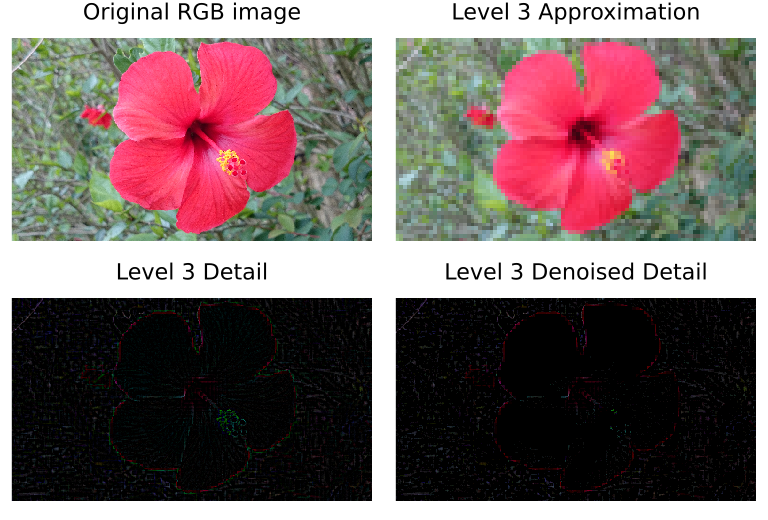

In [58]:
# Choose level l=0,1,2,...,L
l=3

P1=plot(colorview(RGB,AAA[:,:,:]),
    title="Original RGB image",
    titlefontsize=15,
    xaxis=false, 
    xticks=false, 
    yaxis=false, 
    yticks=false, 
    grid=false);
P2=plot(colorview(RGB,Wapprox[:,:,:,l+1]),
    title="Level $l Approximation",
    titlefontsize=15,
    xaxis=false, 
    xticks=false, 
    yaxis=false, 
    yticks=false, 
    grid=false);
P3=plot(colorview(RGB,Wdetail[:,:,:,l+1]),
    title="Level $l Detail",
    titlefontsize=15,
    xaxis=false, 
    xticks=false, 
    yaxis=false, 
    yticks=false, 
    grid=false);
P4=plot(colorview(RGB,Wedge[:,:,:,l+1]),
    title="Level $l Denoised Detail",
    titlefontsize=15,
    xaxis=false, 
    xticks=false, 
    yaxis=false, 
    yticks=false, 
    grid=false);
plot(P1,P2,P3,P4,size=(768,520),layout=(2,2))

## 5. Public data and visualization

Let $\vec{x}=\bigl[x[1],\dotsc,x[N]\bigl]^T\in\mathbb{R}^N$ be an $N$-dimensional real column vector. This can describes data such as $x[i]$ means the highest temperature of the $i$-th day for $i=1,\dotsc,N$. One can exploit some information such as the average $m$ and the variance $\sigma^2$:

$$m:=\frac{1}{N}\sum_{i=1}^Nx[i],
\quad
\sigma^2:=\frac{1}{N}\sum_{i=1}^N(x[i]-m)^2.$$

In what follows Julia downloads open data, and visualizes information taking averages, maximums and minimums. More concretely Julia downloads 
- the daily maximum tenperature
- the daily minimum tenpereture
- the daily mean tenperature 
of 1884-present at the Hong Kong Observatory. The starting dates of  the theree data are not same, and so we make use of data of 140 years of 1885-2024. The Hong Kong Observatory dataset has no daily temperature records from 1 Jan 1940 to 31 Dec 1946, due to the disruption of WWII and the Japanese occupation. This 7-year gap means that analyses requiring continuous daily data over multiple years will be affected if these years are included. To ensure consistency, we restrict the analysis period to 1 Jan 1947 – 31 Dec 2024.

#### Run the following cell to donwload the public data and show the table.

In [68]:
Downloads.download("https://data.weather.gov.hk/weatherAPI/opendata/opendata.php?dataType=CLMMAXT&rformat=csv&station=HKO","HK_Maximun_Temperature.csv");
Downloads.download("https://data.weather.gov.hk/weatherAPI/opendata/opendata.php?dataType=CLMMINT&rformat=csv&station=HKO","HK_Minimum_Temperature.csv");
Downloads.download("https://data.weather.gov.hk/weatherAPI/opendata/opendata.php?dataType=CLMTEMP&rformat=csv&station=HKO","HK_Mean_Temperature.csv");

Amax = CSV.read("HK_Maximun_Temperature.csv", DataFrame, 
			 header=["Year", "Month", "Day", "Maximum", "C"],
			 skipto=370,
			 footerskip=3,
			 types=Dict("Maximum" => Float64),
			 drop=["C"],
			 missingstring="***",
			 normalizenames=true); 
delete!(Amax, 48579:nrow(Amax));
Amean = CSV.read("HK_Mean_Temperature.csv", DataFrame, 
			 header=["Year", "Month", "Day", "Average", "C"],
			 skipto=310,
			 footerskip=3,
			 types=Dict("Average" => Float64),
			 drop=["C"],
			 missingstring="***",
			 normalizenames=true); 
delete!(Amean, 48579:nrow(Amean));
Amin = CSV.read("HK_Minimum_Temperature.csv", DataFrame, 
			 header=["Year", "Month", "Day", "Minimum", "C"],
			 skipto=370,
			 footerskip=3,
			 types=Dict("Minimum" => Float64),
			 drop=["C"],
			 missingstring="***",
			 normalizenames=true); 
delete!(Amin, 48579:nrow(Amin));

A = outerjoin(Amax, Amean, Amin,on = [:Year, :Month, :Day])

Row,Year,Month,Day,Maximum,Average,Minimum
,Int64,Int64,Int64,Float64?,Float64?,Float64?
1,1885,1,1,17.8,15.3,13.9
2,1885,1,2,20.5,16.7,14.2
3,1885,1,3,16.6,15.4,14.8
4,1885,1,4,18.6,16.1,14.6
5,1885,1,5,20.8,17.5,15.1
6,1885,1,6,21.1,18.3,16.8
7,1885,1,7,19.9,17.9,15.4
8,1885,1,8,17.3,15.6,14.2
9,1885,1,9,16.9,15.7,14.7


#### Run the following cell to draw the line graphs of Annual maximum, average, and minimum temperatures.
Over the long term, temperatures are rising slowly.

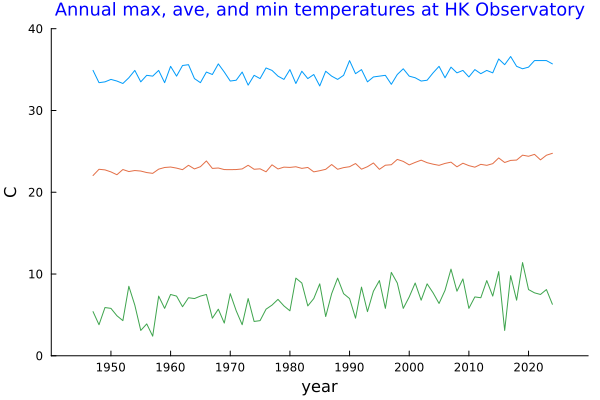

In [69]:
A_1947_2024 = filter(:Year => y -> 1947 <= y <= 2024, A);
	Y = combine(groupby(A_1947_2024, :Year),
    :Maximum => maximum => :Ymax,
    :Average => mean     => :Yavg,
    :Minimum => minimum  => :Ymin
		)

	plot(Matrix(Y)[:,2:4],
		 title="Annual max, ave, and min temperatures at HK Observatory",
		 titlefontsize=12,
		 titlefontcolor="blue",
		 xlim=(-6,84),
		 xticks=([4,14,24,34,44,54,64,74],
        [1950 1960 1970 1980 1990 2000 2010 2020]),
		 ylim=(0,40),
		 grid=false,
		 xlabel="year",
		 ylabel="C",
		 legend=false)

## Run the following cell to create a movie showing the monthy maximum, average, and minmum temperatures in each year between 1947 and 2024.

[ Info: Saved animation to /home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/HK_Observatory_animation2.gif


Plots.AnimatedGif("/home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/HK_Observatory_animation2.gif")
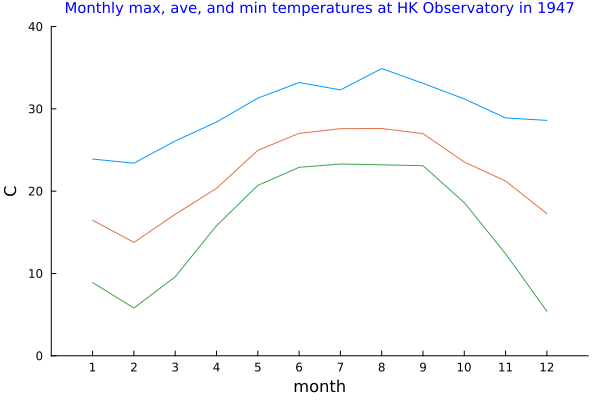

In [72]:
animhko = @animate for k=1947:2024

M = combine(groupby(A_1947_2024, [:Year, :Month]),
:Maximum => maximum => :Mmax,
:Average => mean    => :Mavg,
:Minimum => minimum => :Mmin)
	
Myy = sort(M[M.Year .== k, :], :Month) 
	
plot(Matrix(Myy[:,3:5]),
    title="Monthly max, ave, and min temperatures at HK Observatory in $k",
	titlefontsize=10,
	titlefontcolor="blue",
	xlim=(0,13),
	xticks=([1,2,3,4,5,6,7,8,9,10,11,12]),
	ylim=(0,40),
	grid=false,
	xlabel="month",
	ylabel="C",
	legend=false)

end
gif(animhko, "HK_Observatory_animation.gif", fps = 2)	

## 6. Central limit theorem for the binomial distribution $B(n,p)$
Let $n$ be a positive integer, and let $p$ be a constant satisfying $0 < p < 1$. 
Denote by $B(n,p)$ the the binomial distribution of $n$ iid experiments $X_1,\dotsc,X_n$ with probability $p$, that is, a discrete probability distribution on $\{0,1,\dotsc,n\}$ such that 

$$\operatorname{P}(S_n=k)=\frac{n!}{k!(n-k)!}p^k(1-p)^{n-k}, 
\quad
k=0,1,\dotsc,n,$$

where $S_n:=X_1+\dotsb+X_n$.

It is well-known that for any $a,b\in\mathbb{R}$ with $a<b$, 

$$\operatorname{P}
\left(
a \leqq \frac{S_n-pn}{\sqrt{np(1-p)}} \leqq b
\right)
\rightarrow
\frac{1}{\sqrt{2\pi}}
\int_a^be^{-x^2/2}dx
\quad
(n \rightarrow \infty),$$

which is a typical example of the central limit theorem. 

#### Choose $p\in(0,1)$ and run the following cell to create a movie of the central limit theorem

[ Info: Saved animation to /home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/CLT_animation.gif


Plots.AnimatedGif("/home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/CLT_animation.gif")
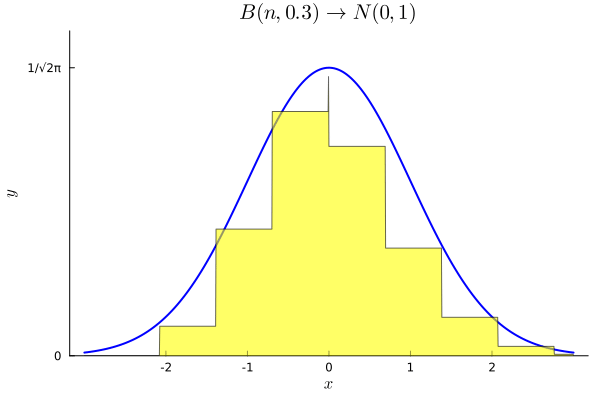

In [39]:
# Choose 0<p<1
p=0.3;

x1 = range(-3, 3, length = 1201);
f1 = exp.(-x1.^2/2)/sqrt(2*pi);

animclt = @animate for m=1:150
n1=10*m
z2=zeros(n1+2*max(100,n1));
for l=0:n1
	z2[l+max(100,n1)+1]=Float64(sqrt(n1*p*(1-p))*factorial(BigInt(n1))*p^l*(1-p)^(n1-l)/factorial(BigInt(l))/factorial(BigInt(n1-l)));
end
	
z1 = zeros(length(x1));
c1 = Int64((length(x1)-1)/2);
for k=1:c1
	z1[c1+k]=z2[max(100,n1)+2+Int64(floor(n1*p+(k-1)/200*sqrt(n1*p*(1-p))))];
	z1[c1+1-k]=z2[max(100,n1)+1+Int64(floor(n1*p-(k-1)/200*sqrt(n1*p*(1-p))))];
end

plot(f1,
	title=(L"B(n,%$p) \rightarrow N(0,1)"),
	grid=false,
	ylim=(0,0.45), 
	xticks=([201 401 601 801 1001;],[-2,-1,0,1,2]),
	yticks=([0 1/sqrt(2*pi);],[0,"1/√2π"]),
	xlabel=(L"x"),
	ylabel=(L"y"), 
	edgecolor=:false, 
	legend=:false,
	lw=2,
	color=:blue)
plot!(z1, seriestype=:shape, color=:yellow, alpha=0.6)

end
gif(animclt, "CLT_animation.gif", fps = 10)	

## 7. Taylor series of $\sin{x}$

It is well-known that $\sin{x}$ ($x\in\mathbb{R}$) equals a power series of $s$: 

$$\sin{x}=\sum_{k=0}^\infty\frac{(-1)^kx^{2k+1}}{(2k+1)!}, \quad x\in\mathbb{R}.$$

The right hand side is said to be the Taylor series of $\sin{x}$ or the Taylor expansion of $\sin{x}$. More precisely, for any $R>0$, 

$$\max_{x\in[-R,R]}
\left\lvert
\sin{x}
-
\sum_{k=0}^K
\frac{(-1)^kx^{2k+1}}{(2k+1)!}
\right\rvert
\rightarrow 0 \quad (K\rightarrow\infty).$$

We now observe this convergence. Set 

$$S_K(x)
:=
\sum_{k=0}^K
\frac{(-1)^kx^{2k+1}}{(2k+1)!}.$$

#### Run the following cell to create a movie.

[ Info: Saved animation to /home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/CLT_animation.gif


Plots.AnimatedGif("/home/hc/Dropbox/Julia/ATCM/ATCM2026/Jupyter/CLT_animation.gif")
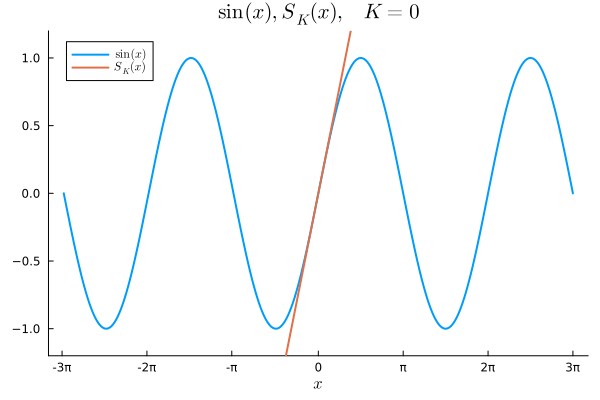

In [46]:
x = range(-3*pi, 3*pi, length = 301);
f3=sin.(x);
KK=14;
s3=zeros(KK+1,301);
for k=0:KK
	for l=1:301
        s3[k+1,l]=(-1)^k*x[l]^(2*k+1)/factorial(big(2*k+1));
    end
end
	
S3=zeros(KK+1,301);
S3[1,:]=s3[1,:];
for l=1:301
    for k=2:KK+1
		S3[k,l]=S3[k-1,l]+s3[k,l];
	end
end

animtaylor = @animate for K=0:KK
h3=S3[K+1,:];
plot([f3,h3],grid=false,linewidth=2,ylim=(-1.2,1.2),
	title=(L"\sin(x), S_K(x), \quad K=%$K"),
	xticks = ([0 50 100 151 201 251 301;], ["-3π","-2π","-π","0","π","2π","3π"]),
	xlabel=L"x",
	label=[L"\sin(x)" L"S_K(x)"],
	legend=:topleft,legendfont=font(8))

end
gif(animtaylor, "CLT_animation.gif", fps = 1)	